In [1]:
# https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-rt-detr-on-custom-dataset-with-transformers.ipynb?ref=blog.roboflow.com#scrollTo=h8KHJfSZFh7L
# https://blog.roboflow.com/train-rt-detr-custom-dataset-transformers/

In [2]:
!nvidia-smi

Sun Sep  8 16:33:02 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 552.12                 Driver Version: 552.12         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3080 ...  WDDM  |   00000000:01:00.0  On |                  N/A |
| N/A   54C    P8             23W /  130W |     952MiB /   8192MiB |     22%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
!python -V

Python 3.11.7


In [3]:
# !pip install -q git+https://github.com/huggingface/transformers.git
# !pip install -q git+https://github.com/roboflow/supervision.git
# !pip install -q accelerate
# !pip install -q roboflow
# !pip install -q torchmetrics
# !pip install -q "albumentations>=1.4.5"

In [4]:
import torch #
import requests #

import numpy as np #
import supervision as sv #
import albumentations as A #

from PIL import Image #
from pprint import pprint #
from roboflow import Roboflow
from dataclasses import dataclass, replace #
# from google.colab import userdata
from torch.utils.data import Dataset
from transformers import (
    AutoImageProcessor,
    AutoModelForObjectDetection,
    TrainingArguments,
    Trainer
)
from torchmetrics.detection.mean_ap import MeanAveragePrecision #

In [5]:
# @title Load model

# CHECKPOINT = "PekingU/rtdetr_r50vd_coco_o365"
# DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# model = AutoModelForObjectDetection.from_pretrained(CHECKPOINT).to(DEVICE)
# processor = AutoImageProcessor.from_pretrained(CHECKPOINT)

# Use the main detr-resnet-50 rather than the RT (Real-Time) one

CHECKPOINT = "facebook/detr-resnet-50"
# CHECKPOINT = "PekingU/rtdetr_r50vd_coco_o365"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

processor = AutoImageProcessor.from_pretrained(CHECKPOINT)
model = AutoModelForObjectDetection.from_pretrained(CHECKPOINT).to(DEVICE)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [6]:
URL = "https://media.roboflow.com/notebooks/examples/dog.jpeg"

image = Image.open(requests.get(URL, stream=True).raw)
inputs = processor(image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    outputs = model(**inputs)

w, h = image.size
results = processor.post_process_object_detection(
    outputs, target_sizes=[(h, w)], threshold=0.3)

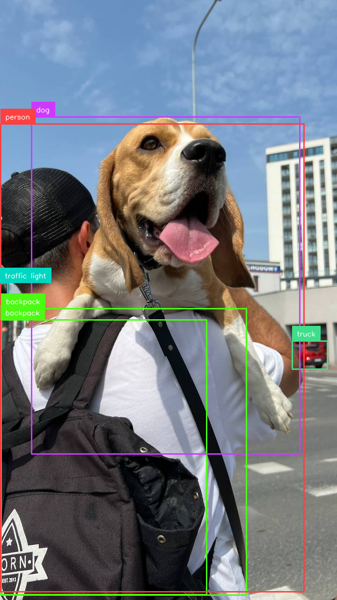

In [7]:
# @title Display result with NMS

detections = sv.Detections.from_transformers(results[0])
labels = [
    model.config.id2label[class_id]
    for class_id
    in detections.class_id
]

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(annotated_image, detections)
annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels=labels)
annotated_image.thumbnail((600, 600))
annotated_image

In [8]:
# !pip install roboflow

# from roboflow import Roboflow
rf = Roboflow(api_key="your_key_here")
project = rf.workspace("assuralabs").project("av-water-damage")
version = project.version(1)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...


In [9]:
ds_train = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/train",
    annotations_path=f"{dataset.location}/train/_annotations.coco.json",
)
ds_valid = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/valid",
    annotations_path=f"{dataset.location}/valid/_annotations.coco.json",
)
ds_test = sv.DetectionDataset.from_coco(
    images_directory_path=f"{dataset.location}/test",
    annotations_path=f"{dataset.location}/test/_annotations.coco.json",
)

# duplicating the ds_train_temp because albumentations will heavily modify each original image
# Will reduce epochs to 64 because this is twice as much training data
# ds_train = sv.DetectionDataset.merge([ds_train_temp, ds_train_temp])

print(f"Number of training images: {len(ds_train)}")
print(f"Number of validation images: {len(ds_valid)}")
print(f"Number of test images: {len(ds_test)}")

Number of training images: 747
Number of validation images: 215
Number of test images: 183


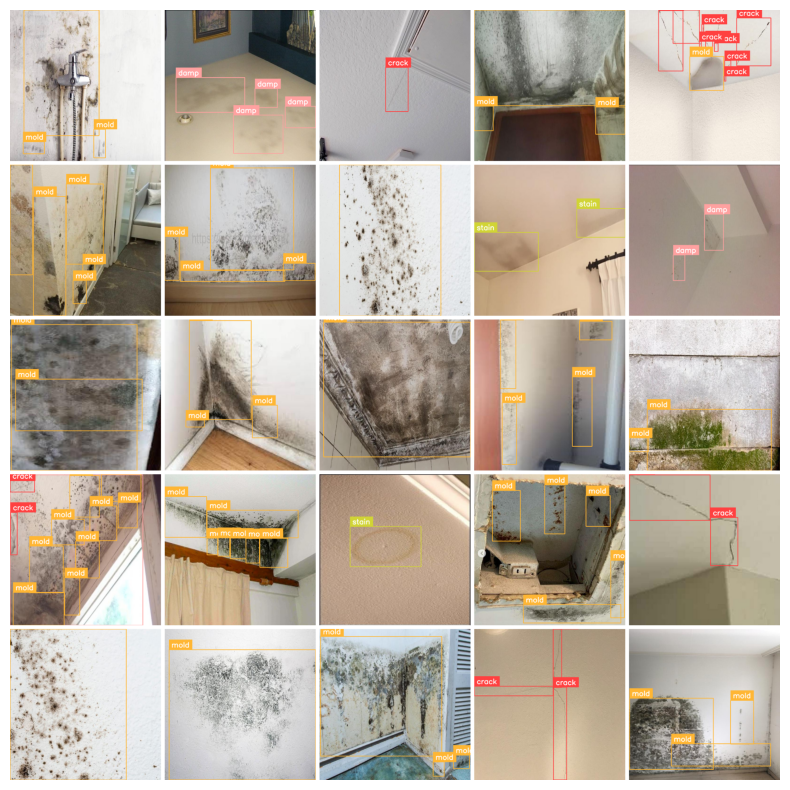

In [10]:
# @title Display dataset sample

GRID_SIZE = 5

def annotate(image, annotations, classes):
    labels = [
        classes[class_id]
        for class_id
        in annotations.class_id
    ]

    bounding_box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator(text_scale=1, text_thickness=2)

    annotated_image = image.copy()
    annotated_image = bounding_box_annotator.annotate(annotated_image, annotations)
    annotated_image = label_annotator.annotate(annotated_image, annotations, labels=labels)
    return annotated_image

annotated_images = []
for i in range(GRID_SIZE * GRID_SIZE):
    _, image, annotations = ds_train[i]
    annotated_image = annotate(image, annotations, ds_train.classes)
    annotated_images.append(annotated_image)

grid = sv.create_tiles(
    annotated_images,
    grid_size=(GRID_SIZE, GRID_SIZE),
    single_tile_size=(400, 400),
    tile_padding_color=sv.Color.WHITE,
    tile_margin_color=sv.Color.WHITE
)
sv.plot_image(grid, size=(10, 10))

In [11]:
IMAGE_SIZE = 640

processor = AutoImageProcessor.from_pretrained(
    CHECKPOINT,
    do_resize=True,
    size={"width": IMAGE_SIZE, "height": IMAGE_SIZE},
)

In [12]:
train_augmentation_and_transform = A.Compose(
    [
        A.Perspective(p=0.1),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.Transpose(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(p=0.1),
        
    ],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=25
    ),
)

valid_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="pascal_voc",
        label_fields=["category"],
        clip=True,
        min_area=1
    ),
)

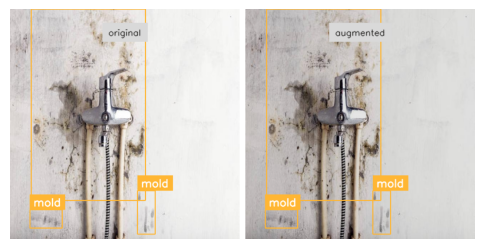

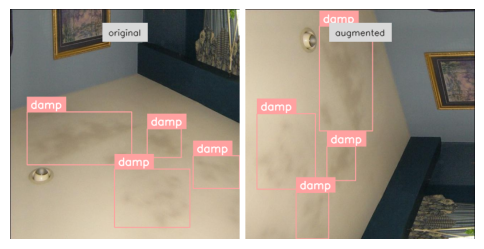

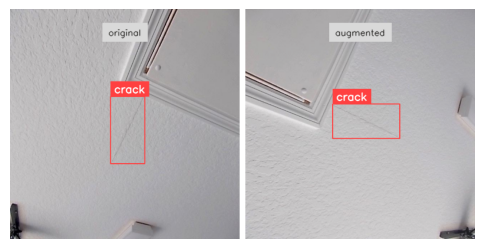

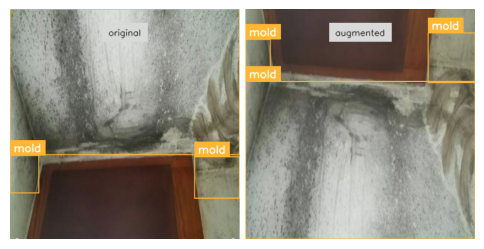

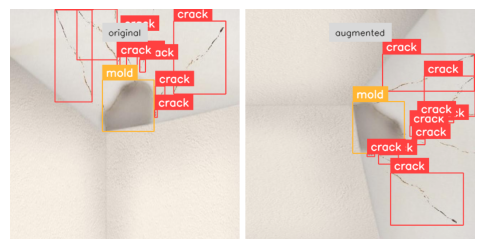

In [13]:
# @title Visualize some augmented images

IMAGE_COUNT = 5

for i in range(IMAGE_COUNT):
    _, image, annotations = ds_train[i]

    output = train_augmentation_and_transform(
        image=image,
        bboxes=annotations.xyxy,
        category=annotations.class_id
    )

    augmented_image = output["image"]
    augmented_annotations = replace(
        annotations,
        xyxy=np.array(output["bboxes"]),
        class_id=np.array(output["category"])
    )

    annotated_images = [
        annotate(image, annotations, ds_train.classes),
        annotate(augmented_image, augmented_annotations, ds_train.classes)
    ]
    grid = sv.create_tiles(
        annotated_images,
        titles=['original', 'augmented'],
        titles_scale=0.5,
        single_tile_size=(400, 400),
        tile_padding_color=sv.Color.WHITE,
        tile_margin_color=sv.Color.WHITE
    )
    sv.plot_image(grid, size=(6, 6))

In [14]:
class PyTorchDetectionDataset(Dataset):
    def __init__(self, dataset: sv.DetectionDataset, processor, transform: A.Compose = None):
        self.dataset = dataset
        self.processor = processor
        self.transform = transform

    @staticmethod
    def annotations_as_coco(image_id, categories, boxes):
        annotations = []
        for category, bbox in zip(categories, boxes):
            x1, y1, x2, y2 = bbox
            formatted_annotation = {
                "image_id": image_id,
                "category_id": category,
                "bbox": [x1, y1, x2 - x1, y2 - y1],
                "iscrowd": 0,
                "area": (x2 - x1) * (y2 - y1),
            }
            annotations.append(formatted_annotation)

        return {
            "image_id": image_id,
            "annotations": annotations,
        }

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        _, image, annotations = self.dataset[idx]

        # Convert image to RGB numpy array
        image = image[:, :, ::-1]
        boxes = annotations.xyxy
        categories = annotations.class_id

        if self.transform:
            transformed = self.transform(
                image=image,
                bboxes=boxes,
                category=categories
            )
            image = transformed["image"]
            boxes = transformed["bboxes"]
            categories = transformed["category"]


        formatted_annotations = self.annotations_as_coco(
            image_id=idx, categories=categories, boxes=boxes)
        result = self.processor(
            images=image, annotations=formatted_annotations, return_tensors="pt")

        # Image processor expands batch dimension, lets squeeze it
        result = {k: v[0] for k, v in result.items()}

        return result

In [15]:
import random
random.seed(3)

pytorch_dataset_train_temp_1 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(5)

pytorch_dataset_train_temp_2 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(8)

pytorch_dataset_train_temp_3 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(13)

pytorch_dataset_train_temp_4 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(21)

pytorch_dataset_train_temp_5 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(34)

pytorch_dataset_train_temp_6 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(55)

pytorch_dataset_train_temp_7 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(89)

pytorch_dataset_train_temp_8 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(144)

pytorch_dataset_train_temp_9 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)

random.seed(233)

pytorch_dataset_train_temp_10 = PyTorchDetectionDataset(
    ds_train, processor, transform=train_augmentation_and_transform)


pytorch_dataset_valid = PyTorchDetectionDataset(
    ds_valid, processor, transform=valid_transform)
pytorch_dataset_test = PyTorchDetectionDataset(
    ds_test, processor, transform=valid_transform)

pytorch_dataset_trains = []
pytorch_dataset_trains.append(pytorch_dataset_train_temp_1)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_2)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_3)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_4)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_5)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_6)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_7)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_8)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_9)
pytorch_dataset_trains.append(pytorch_dataset_train_temp_10)

pytorch_dataset_train = torch.utils.data.ConcatDataset(pytorch_dataset_trains)

pytorch_dataset_train[15]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


{'pixel_values': tensor([[[-0.5253, -0.5253, -0.5253,  ...,  1.1187,  1.2557,  1.7352],
          [-0.5253, -0.5253, -0.5082,  ...,  1.1872,  1.3070,  1.7694],
          [-0.5253, -0.5082, -0.5082,  ...,  1.2899,  1.3927,  1.8037],
          ...,
          [ 1.4098,  1.3927,  1.3927,  ...,  0.0912,  0.1254,  0.1426],
          [ 1.4098,  1.3927,  1.3927,  ...,  0.0912,  0.1254,  0.1426],
          [ 1.4098,  1.3927,  1.3927,  ...,  0.0912,  0.1254,  0.1426]],
 
         [[-0.6176, -0.6176, -0.6176,  ...,  1.2906,  1.4307,  1.9209],
          [-0.6176, -0.6176, -0.6001,  ...,  1.3606,  1.4832,  1.9559],
          [-0.6176, -0.6001, -0.6001,  ...,  1.4657,  1.5707,  1.9909],
          ...,
          [ 1.5357,  1.5182,  1.5182,  ...,  0.1877,  0.2227,  0.2402],
          [ 1.5357,  1.5182,  1.5182,  ...,  0.1877,  0.2227,  0.2402],
          [ 1.5357,  1.5182,  1.5182,  ...,  0.1877,  0.2227,  0.2402]],
 
         [[-0.3927, -0.3927, -0.3927,  ...,  1.4025,  1.5420,  2.0474],
          [-

In [16]:
def collate_fn(batch):
    data = {}
    data["pixel_values"] = torch.stack([x["pixel_values"] for x in batch])
    data["labels"] = [x["labels"] for x in batch]
    return data

In [17]:
id2label = {id: label for id, label in enumerate(ds_train.classes)}
label2id = {label: id for id, label in enumerate(ds_train.classes)}


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


class MAPEvaluator:

    def __init__(self, image_processor, threshold=0.00, id2label=None):
        self.image_processor = image_processor
        self.threshold = threshold
        self.id2label = id2label

    def collect_image_sizes(self, targets):
        """Collect image sizes across the dataset as list of tensors with shape [batch_size, 2]."""
        image_sizes = []
        for batch in targets:
            batch_image_sizes = torch.tensor(np.array([x["size"] for x in batch]))
            image_sizes.append(batch_image_sizes)
        return image_sizes

    def collect_targets(self, targets, image_sizes):
        post_processed_targets = []
        for target_batch, image_size_batch in zip(targets, image_sizes):
            for target, (height, width) in zip(target_batch, image_size_batch):
                boxes = target["boxes"]
                boxes = sv.xcycwh_to_xyxy(boxes)
                boxes = boxes * np.array([width, height, width, height])
                boxes = torch.tensor(boxes)
                labels = torch.tensor(target["class_labels"])
                post_processed_targets.append({"boxes": boxes, "labels": labels})
        return post_processed_targets

    def collect_predictions(self, predictions, image_sizes):
        post_processed_predictions = []
        for batch, target_sizes in zip(predictions, image_sizes):
            batch_logits, batch_boxes = batch[1], batch[2]
            output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
            post_processed_output = self.image_processor.post_process_object_detection(
                output, threshold=self.threshold, target_sizes=target_sizes
            )
            post_processed_predictions.extend(post_processed_output)
        return post_processed_predictions

    @torch.no_grad()
    def __call__(self, evaluation_results):

        predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

        image_sizes = self.collect_image_sizes(targets)
        post_processed_targets = self.collect_targets(targets, image_sizes)
        post_processed_predictions = self.collect_predictions(predictions, image_sizes)

        evaluator = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
        evaluator.warn_on_many_detections = False
        evaluator.update(post_processed_predictions, post_processed_targets)

        metrics = evaluator.compute()

        # Replace list of per class metrics with separate metric for each class
        classes = metrics.pop("classes")
        map_per_class = metrics.pop("map_per_class")
        mar_100_per_class = metrics.pop("mar_100_per_class")
        for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
            class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
            metrics[f"map_{class_name}"] = class_map
            metrics[f"mar_100_{class_name}"] = class_mar

        metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

        return metrics

eval_compute_metrics_fn = MAPEvaluator(image_processor=processor, threshold=0.01, id2label=id2label)

In [18]:
model = AutoModelForObjectDetection.from_pretrained(
    CHECKPOINT,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [19]:
# https://datascience.stackexchange.com/questions/103022/warmup-steps-in-deep-learning

training_args = TrainingArguments(
    output_dir=f"{dataset.name.replace(' ', '-')}-finetune",
    num_train_epochs=64,
    max_grad_norm=0.01,
    learning_rate=5e-5,
    # lr_scheduler_type="cosine",
    warmup_ratio=0.06,
    per_device_train_batch_size=16,
    # dataloader_num_workers=2,
    metric_for_best_model="eval_map",
    greater_is_better=True,
    load_best_model_at_end=True,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    remove_unused_columns=False,
    eval_do_concat_batches=False,
    logging_strategy="epoch",
    # logging_steps=500,
    weight_decay=1e-4,
)

In [20]:
5640*16/120

752.0

In [21]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=pytorch_dataset_train,
    eval_dataset=pytorch_dataset_valid,
    tokenizer=processor,
    data_collator=collate_fn,
    compute_metrics=eval_compute_metrics_fn,
)

trainer.train()

Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Crack,Mar 100 Crack,Map Damp,Mar 100 Damp,Map Dampness,Mar 100 Dampness,Map Mold,Mar 100 Mold,Map Stain,Mar 100 Stain
1,4.256100,3.031680,0.000900,0.003100,0.000400,0.000000,0.000100,0.001600,0.004800,0.016200,0.049200,0.000000,0.012800,0.069300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004700,0.246000,0.000000,0.000000
2,2.513900,2.576494,0.006400,0.014600,0.004400,0.000300,0.000800,0.008900,0.008800,0.027700,0.058500,0.002500,0.029900,0.077200,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.032100,0.292300,0.000000,0.000000
3,2.362400,2.445590,0.006900,0.017100,0.003800,0.000000,0.004100,0.009900,0.013900,0.032500,0.061200,0.003300,0.040300,0.077300,0.002000,0.004800,0.004000,0.007300,0.000000,0.000000,0.028400,0.293800,0.000000,0.000000
4,2.338100,2.554369,0.013800,0.029400,0.012000,0.000000,0.004200,0.019400,0.016000,0.046600,0.079900,0.000800,0.032400,0.108400,0.000200,0.009500,0.000200,0.014500,0.000000,0.000000,0.050200,0.324500,0.018400,0.051100
5,2.275100,2.430867,0.006900,0.022400,0.003400,0.000100,0.008100,0.012600,0.016200,0.051700,0.087000,0.008300,0.053600,0.110600,0.008500,0.050800,0.000500,0.010900,0.000000,0.000000,0.024600,0.309400,0.001000,0.063800
6,2.188400,2.305122,0.015300,0.037300,0.011400,0.000100,0.011900,0.019800,0.027600,0.078500,0.119000,0.001700,0.060200,0.156600,0.017800,0.134900,0.000500,0.049100,0.000000,0.000000,0.056600,0.328100,0.001700,0.083000
7,2.160900,2.215753,0.023700,0.056400,0.014100,0.001000,0.014700,0.034100,0.028700,0.076900,0.113400,0.003300,0.060900,0.148700,0.041300,0.139700,0.001900,0.036400,0.000000,0.000000,0.062000,0.335600,0.013300,0.055300
8,2.099000,2.173176,0.014100,0.038000,0.008700,0.001200,0.009800,0.021600,0.022500,0.082000,0.121100,0.012500,0.086600,0.149400,0.014200,0.176200,0.005300,0.049100,0.000000,0.000000,0.048800,0.339600,0.002200,0.040400
9,2.072800,2.191002,0.020500,0.048400,0.014500,0.000200,0.011200,0.032900,0.043400,0.110400,0.157600,0.007500,0.081900,0.208600,0.027800,0.290500,0.014400,0.105500,0.000000,0.000000,0.055100,0.332500,0.005100,0.059600
10,2.016600,2.104266,0.031400,0.073900,0.022500,0.001200,0.009200,0.045600,0.051500,0.137800,0.197200,0.011700,0.107900,0.259000,0.051300,0.317500,0.015600,0.141800,0.000000,0.000000,0.081800,0.352200,0.008000,0.174500


TrainOutput(global_step=29888, training_loss=1.5771031553280686, metrics={'train_runtime': 61199.7935, 'train_samples_per_second': 7.812, 'train_steps_per_second': 0.488, 'total_flos': 1.4619877967344435e+20, 'train_loss': 1.5771031553280686, 'epoch': 64.0})

In [22]:
# pip install pycocotools

In [23]:
# pip install torch==2.4.0 torchvision==0.19.0 torchaudio==2.4.0 --index-url https://download.pytorch.org/whl/cu124

In [24]:
# pip install torch==2.3.0+cu121
# pip install torch==0.18.0+cu121

In [25]:
from pprint import pprint

# metrics = trainer.evaluate(eval_dataset=pytorch_dataset_train, metric_key_prefix="train")
# pprint(metrics)

In [26]:
metrics = trainer.evaluate(eval_dataset=pytorch_dataset_valid, metric_key_prefix="eval")
pprint(metrics)

{'epoch': 64.0,
 'eval_loss': 1.9827451705932617,
 'eval_map': 0.1133,
 'eval_map_50': 0.2086,
 'eval_map_75': 0.1049,
 'eval_map_crack': 0.2038,
 'eval_map_damp': 0.1081,
 'eval_map_dampness': 0.0,
 'eval_map_large': 0.1661,
 'eval_map_medium': 0.0375,
 'eval_map_mold': 0.0936,
 'eval_map_small': 0.0268,
 'eval_map_stain': 0.161,
 'eval_mar_1': 0.137,
 'eval_mar_10': 0.236,
 'eval_mar_100': 0.2961,
 'eval_mar_100_crack': 0.4048,
 'eval_mar_100_damp': 0.3364,
 'eval_mar_100_dampness': 0.0,
 'eval_mar_100_mold': 0.3903,
 'eval_mar_100_stain': 0.3489,
 'eval_mar_large': 0.3974,
 'eval_mar_medium': 0.1266,
 'eval_mar_small': 0.0325,
 'eval_runtime': 13.6742,
 'eval_samples_per_second': 15.723,
 'eval_steps_per_second': 1.975}


In [27]:
from pprint import pprint

metrics = trainer.evaluate(eval_dataset=pytorch_dataset_test, metric_key_prefix="test")
pprint(metrics)

{'epoch': 64.0,
 'test_loss': 1.898290753364563,
 'test_map': 0.1441,
 'test_map_50': 0.2736,
 'test_map_75': 0.1354,
 'test_map_crack': 0.1373,
 'test_map_damp': 0.1711,
 'test_map_dampness': -1.0,
 'test_map_large': 0.1949,
 'test_map_medium': 0.071,
 'test_map_mold': 0.1043,
 'test_map_small': 0.1369,
 'test_map_stain': 0.1638,
 'test_mar_1': 0.1323,
 'test_mar_10': 0.2867,
 'test_mar_100': 0.3558,
 'test_mar_100_crack': 0.3871,
 'test_mar_100_damp': 0.3586,
 'test_mar_100_dampness': -1.0,
 'test_mar_100_mold': 0.3891,
 'test_mar_100_stain': 0.2885,
 'test_mar_large': 0.4502,
 'test_mar_medium': 0.1843,
 'test_mar_small': 0.15,
 'test_runtime': 11.1986,
 'test_samples_per_second': 16.341,
 'test_steps_per_second': 2.054}


## Predictions for validation

In [28]:
# @title Collect predictions

targets = []
predictions = []

for i in range(len(ds_valid)):
    path, source_image, annotations = ds_valid[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0])

    targets.append(annotations)
    predictions.append(detections)

In [29]:
# @title Calculate mAP
mean_average_precision = sv.MeanAveragePrecision.from_detections(
    predictions=predictions,
    targets=targets,
)

print(f"map50_95: {mean_average_precision.map50_95:.2f}")
print(f"map50: {mean_average_precision.map50:.2f}")
print(f"map75: {mean_average_precision.map75:.2f}")

map50_95: 0.13
map50: 0.22
map75: 0.14


## Predictions for test

In [30]:
# @title Collect predictions

targets = []
predictions = []

for i in range(len(ds_test)):
    path, source_image, annotations = ds_test[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0])

    targets.append(annotations)
    predictions.append(detections)

In [31]:
# @title Calculate mAP
mean_average_precision = sv.MeanAveragePrecision.from_detections(
    predictions=predictions,
    targets=targets,
)

print(f"map50_95: {mean_average_precision.map50_95:.2f}")
print(f"map50: {mean_average_precision.map50:.2f}")
print(f"map75: {mean_average_precision.map75:.2f}")

map50_95: 0.16
map50: 0.27
map75: 0.17


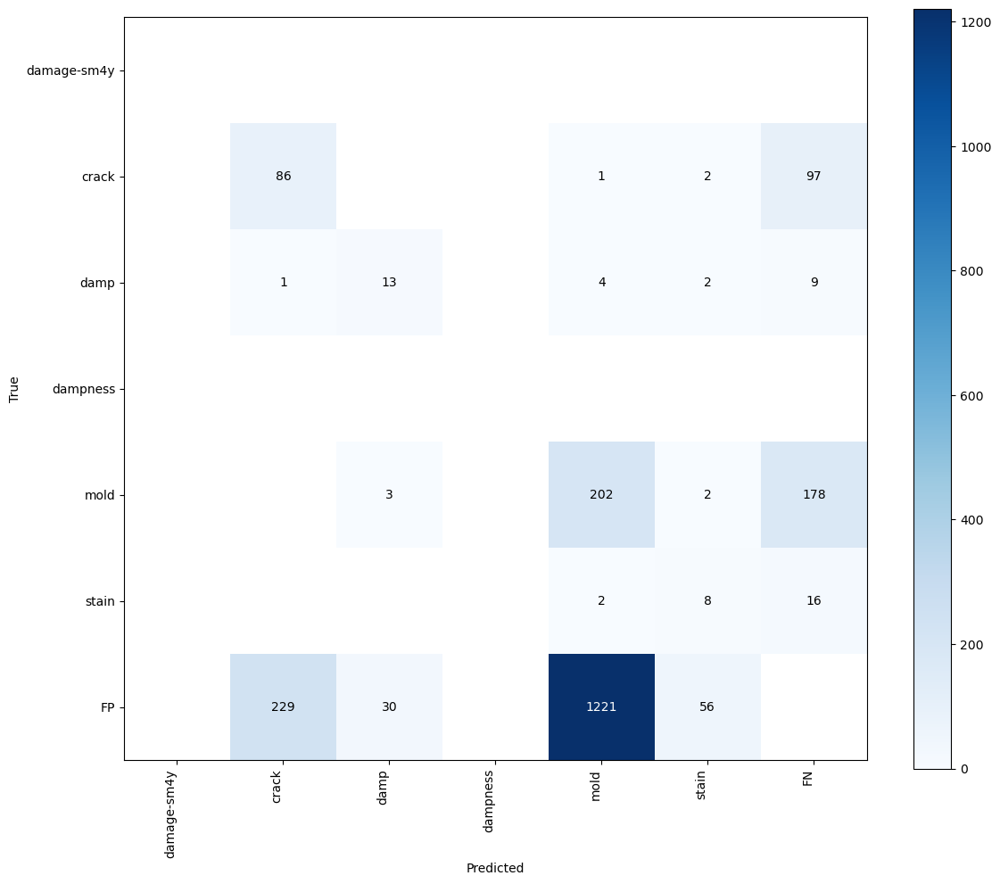

In [32]:
# @title Calculate Confusion Matrix
confusion_matrix = sv.ConfusionMatrix.from_detections(
    predictions=predictions,
    targets=targets,
    classes=ds_test.classes
)

_ = confusion_matrix.plot()

In [33]:
# model.save_pretrained("/content/rt-detr/")
# processor.save_pretrained("/content/rt-detr/")

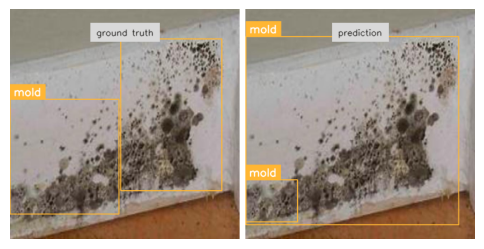

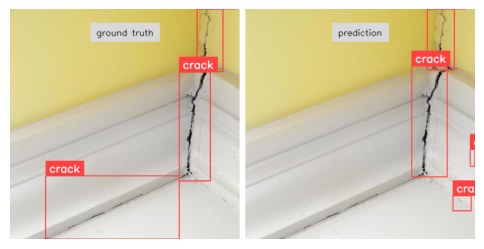

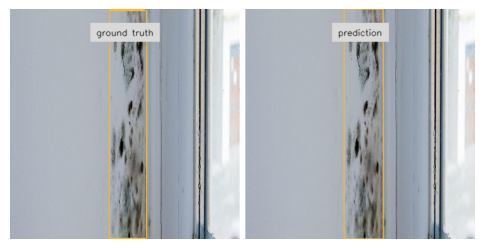

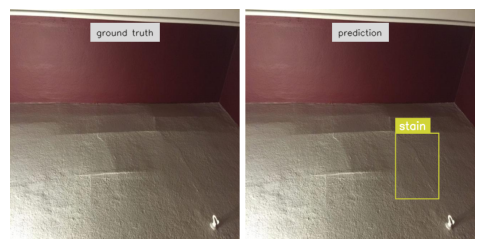

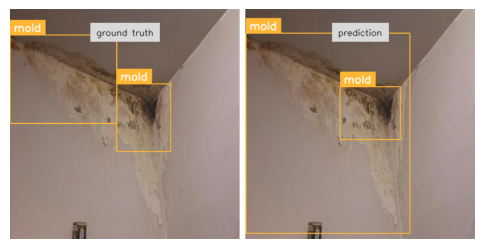

...

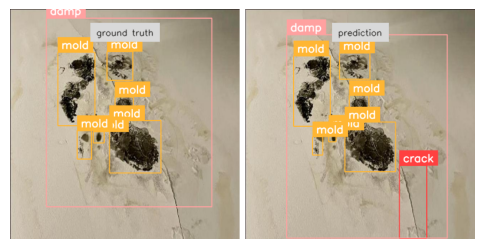

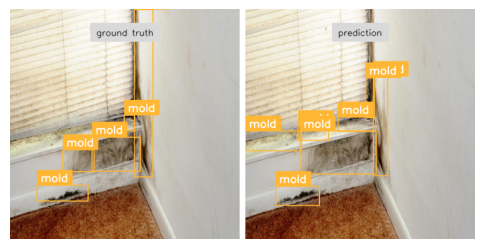

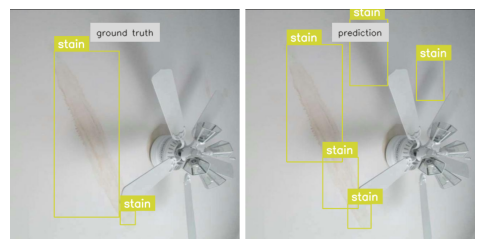

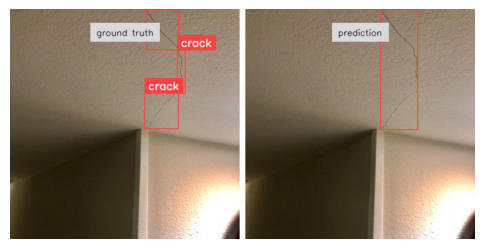

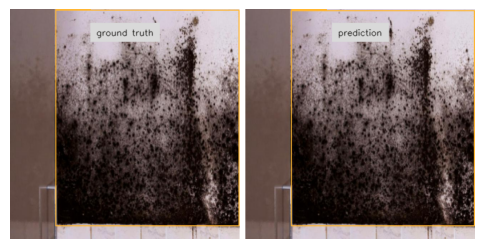

In [34]:
IMAGE_COUNT = 100

for i in range(IMAGE_COUNT):
    path, source_image, annotations = ds_test[i]

    image = Image.open(path)
    inputs = processor(image, return_tensors="pt").to(DEVICE)

    with torch.no_grad():
        outputs = model(**inputs)

    w, h = image.size
    results = processor.post_process_object_detection(
        outputs, target_sizes=[(h, w)], threshold=0.3)

    detections = sv.Detections.from_transformers(results[0]).with_nms(threshold=0.1)

    annotated_images = [
        annotate(source_image, annotations, ds_train.classes),
        annotate(source_image, detections, ds_train.classes)
    ]
    grid = sv.create_tiles(
        annotated_images,
        titles=['ground truth', 'prediction'],
        titles_scale=0.5,
        single_tile_size=(400, 400),
        tile_padding_color=sv.Color.WHITE,
        tile_margin_color=sv.Color.WHITE
    )
    sv.plot_image(grid, size=(6, 6))

In [35]:
trainer.save_model("artifacts/")
processor.save_pretrained("artifacts/")

['artifacts/preprocessor_config.json']